# Машинное обучение, ВМК МГУ

# Практическое задание 2. Обучение без учителя.

## Общая информация
Дата выдачи: 19.03.2023

Мягкий дедлайн: 03.04.2021 23:59 MSK **(за каждый день просрочки снимается 1 балл)**

Жёсткий дедлайн: 10.04.2021 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — **10 баллов + 4.4 бонусов**.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-02-Username.ipynb

Username — ваша фамилия на латинице

<p style="color:#de3815;font-size:25px;">
Напоминание об оформлении и выполнении ноутбука
</p>

* Все строчки должны быть выполнены. Нужно, чтобы output команды можно было увидеть, не запуская ячейки (кроме редких случаев, когда необходимо намеренно скрыть ненужный output, про такие случаи желательно писать пояснения в тексте). **В противном случае -1 балл**
* При оформлении ДЗ нужно пользоваться данным файлом в качестве шаблона. Не нужно удалять и видоизменять написанный код и текст, если явно не указана такая возможность. **В противном случае -1 балл**
* В anytask обязательно нужно прикреплять отдельно файл с расширением ipynb (не в архиве, а именно отдельно). Если необходимо отправить еще какие-то файлы, то вынесите их в отдельный архив (если файлов много) и пришлите. **В противном случае -0.5 балла**
---
* Пишите, пожалуйста, выводы и ответы на вопросы в текстовых ячейках/при помощи print в коде. При их отсутствии мы не можем понять, сделали ли вы задание и понимаете, что происходит, и **поэтому будем снижать баллы**
* Если алгоритм не сказано реализовывать явно, его всегда можно импортировать из библиотеки.
---
* Про графики. _Штрафы будут применяться к каждому результату команды отображения графика (plt.show() и др. аналогичные). Исключением являются графики, генерируемые функциями каких-либо сторонних библиотек, если их нельзя кастомизировать_

    * должно быть название (plt.title) графика; **В противном случае &ndash; -0.05 балла**
    * на графиках должны быть подписаны оси (plt.xlabel, plt.ylabel); **В противном случае &ndash; -0.025 балла за каждую ось**
    * должны быть подписаны единицы измерения (если это возможно); **В противном случае &ndash; -0.025 балла за каждую ось**
    * все названия должны быть понятны любому человеку, знакомому с терминологией, без заглядывания в код; **В противном случае &ndash; -0.05 балла**
    * подписи тиков на осях не должны сливаться как на одной оси, так и между ними; **В противном случае &ndash; -0.025 балла за каждую ось**
    * если изображено несколько сущностей на одном холсте (например несколько функций), то необходима поясняющая легенда (plt.legend); **В противном случае &ndash; -0.05 балла**
    * все линии на графиках должны быть чётко видны (нет похожих цветов или цветов, сливающихся с фоном); **В противном случае &ndash; -0.05 балла**
    * если отображена величина, имеющая очевидный диапазон значений (например, проценты могут быть от 0 до 100), то желательно масштабировать ось на весь диапазон значений (исключением является случай, когда вам необходимо показать малое отличие, которое незаметно в таких масштабах);
    * графики должны быть не супер-микро и не супер-макро по размерам, так, чтобы можно было увидеть все, что нужно.
    * при необходимости улучшения наглядности графиков, можно пользоваться логарифмической шкалой по осям x/y.
    

### А также..

* Для удобства поиска вопросов, на которые от вас просят ответа, мы пометили их знаком **(?)**
* Знак **(!)** означает, что выполнение замечания необходимо для **возможности получения полного балла**
* Даем до +0.3 баллов за выдающиеся успехи по субъективному мнению проверяющих. Этот **бонус** не апеллируется

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



**Замечание:**
* seed менять нежелательно

In [6]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции/семинаре. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [13]:
from numpy import linalg as LA
X = [[1,2,0],
     [3, 4, 5],
     [7, -8, 9]]
D = np.diag(np.sum(X, axis=1))
L = D - X
v, w = LA.eig(L)
asc_index = np.argsort(v)
w = w[:, asc_index].real
w

array([[-0.57735027, -0.22402597, -0.22402597],
       [-0.57735027,  0.34415584,  0.34415584],
       [-0.57735027,  0.78571429,  0.78571429]])

In [14]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans
from numpy import linalg as LA

class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        D = np.diag(np.sum(X, axis=1))
        L = D - X
        eigenvalues, eigenvectors = LA.eig(L)
        asc_index = np.argsort(eigenvalues)
        eigenvectors = eigenvectors[:, asc_index]
        return eigenvectors[:, :self.n_components].real
    #raise NotImplementedError

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [15]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

**Замечание**
* Для возможности получения **полного балла** assert должны проходить

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

**Замечание**
* (?) Напишите, пожалуйста, откуда в итоге скачивали данные. 

In [18]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [20]:
import folium

map_ = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map_)
map_

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать из оставшихся (не включенных еще в маршрут) точек, как самую близкую к последней найденной точке (последней, включенной в маршрут)

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [23]:
dirty_routes = data['RouteNumbers_en'].to_numpy()
clear_routes = ';'.join(dirty_routes).replace(" ", "")
routes_list = clear_routes.split(';')
routes_set = list(set(routes_list))

def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''
    routes = dict.fromkeys(routes_set, [])
    routes_copy = {}
    for j in range(len(routes_set)):
      routes_copy[routes_set[j]]=[]
      for i in range(len(data)):
        if routes_set[j] in str(data['RouteNumbers_en'][i]):
          routes_copy[routes_set[j]].append(data['index'][i])
          routes.update(routes_copy)
    return routes


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''
    pre_coord = []
    for i in range(len(data)):
      pre_coord.append([data['Latitude_WGS84_en'][i], data['Longitude_WGS84_en'][i]])
    coord = np.array(pre_coord)


    from sklearn.metrics.pairwise import haversine_distances
    from math import radians
    coord_in_radians = [0]*coord.shape[0]
    for index in range(coord.shape[0]):
      coord_in_radians[index] = [radians(_) for _ in coord[index]]

    distance_stops = haversine_distances(np.array(coord_in_radians))* 6371000/1000  # multiply by Earth radius to get kilometers

    stop_in_rout = np.zeros((len(data), len(routes)), dtype=int)
    for i in range(len(data)):
      for j in range(len(routes)):
        if str(data['index'][i]) in str(routes[routes_set[j]]):
          stop_in_rout[i, j] = 1

    dist_matrix = [0]*len(routes)
    for i in range(len(routes)):
      dist_matrix[i] = (distance_stops * stop_in_rout.T[i]).T * stop_in_rout.T[i]

    index_of_previous_stop = dict.fromkeys(routes_set, [])
    index_of_previous_stop_copy = {}
    sorted_routes = dict.fromkeys(routes_set, [])
    sorted_routes_copy = {}

    for i in range(len(routes_set)):
        index_of_previous_stop_copy[routes_set[i]]=[]
        sorted_routes_copy[routes_set[i]]=[]
        index_of_previous_stop_copy[routes_set[i]].append(np.argmax(np.sum(dist_matrix[i], axis=0)))
        index_of_previous_stop.update(index_of_previous_stop_copy)
        sorted_routes_copy[routes_set[i]].append(int(data['index'].iloc[index_of_previous_stop_copy[routes_set[i]]]))
        sorted_routes.update(sorted_routes_copy)

    # Теперь отсортируем список остановок в маршруте
    for i in range(len(routes_set)):
      for j in range(len(routes[routes_set[i]])-1):
        try:
          index_of_previous_stop_copy[routes_set[i]].append(np.where(dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j]]==np.min(dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j]][np.nonzero(dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j]])]))[0][0])
          index_of_previous_stop.update(index_of_previous_stop_copy)
          sorted_routes_copy[routes_set[i]].append(data['index'].iloc[index_of_previous_stop_copy[routes_set[i]][j+1]])
          sorted_routes.update(sorted_routes_copy)
          dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j+1]]=np.zeros_like(dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j+1]], dtype=int)
        except ValueError:  #raised if `dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j]]` is empty.
          pass
        except IndexError:
          pass
    return index_of_previous_stop


def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''

    pre_coord = []
    for i in range(len(data)):
      pre_coord.append([data['Latitude_WGS84_en'][i], data['Longitude_WGS84_en'][i]])
    coord = np.array(pre_coord)

    from sklearn.metrics.pairwise import haversine_distances
    from math import radians
    coord_in_radians = [0]*coord.shape[0]
    for index in range(coord.shape[0]):
      coord_in_radians[index] = [radians(_) for _ in coord[index]]

    distance_stops = haversine_distances(np.array(coord_in_radians))* 6371000/1000  # multiply by Earth radius to get kilometers

    stop_in_rout = np.zeros((len(data), len(routes)), dtype=int)
    for i in range(len(data)):
      for j in range(len(routes)):
        if str(data['index'][i]) in str(routes[routes_set[j]]):
          stop_in_rout[i, j] = 1

    adjacency_matrix = [0]*len(routes)
    for i in range(len(routes)):
      adjacency_matrix[i] = (distance_stops * stop_in_rout.T[i]).T * stop_in_rout.T[i]
    return distance_stops

In [27]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [28]:
map_ = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map_)

map_

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [29]:
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''

    cluster_colors=['pink', 'lightblue', 'red', 'blue', 'green', 'purple',
                    'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen',
                    'cadetblue', 'darkpurple', 'gray', 'lightgreen',
                    'black']
    map = folium.Map([55.75215, 37.61819], zoom_start=12)
    for id, row in data.iterrows():
      folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10, color=cluster_colors[labels[id]]).add_to(map)
    return map

**Задание 1.4 (1.5 балла)**. 

* **(0.25 балла)** Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. В этом пункте используйте дефолтные параметры.
* **(0.25 балла)** Визуализируйте результат кластеризации из предыдущего пункта с помощью функции `draw_clustered_map`.
* **(0.75 балла)** А теперь подберите с помощью **кросс-валидации** параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации. В качестве метрики качества можете использовать `silhouette_score`. Визуализируйте полученные результаты для всех трех алгоритмов на *оптимальных параметрах*
* (?) Проинтерпретируйте полученные результаты.
 * **(0.1 балла)** Чем отличаются разбиения на кластеры, получаемые разными алгоритмами?
 * **(0.1 балла)** Какие плюсы и минусы есть у каждого алгоритма?
 * **(0.05 балла)** Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Подсказка:**
* Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).
* Обращайте внимание на баланс объектов в кластерах.

In [30]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

pre_coord = []
for i in range(len(data)):
    pre_coord.append([data['Latitude_WGS84_en'][i], data['Longitude_WGS84_en'][i]])
coord = np.array(pre_coord)

distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 10)

for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(coord)
    kmeanModel.fit(coord)

    distortions.append(sum(np.min(cdist(coord, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / X.shape[0])
    inertias.append(kmeanModel.inertia_)

    mapping1[k] = sum(np.min(cdist(coord, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / X.shape[0]
    mapping2[k] = kmeanModel.inertia_

In [31]:
for key, val in mapping1.items():
    print(f'{key} : {val}')

1 : 0.04368786732132548
2 : 0.028324796661013497
3 : 0.02350566394902497
4 : 0.020536622030040908
5 : 0.018367763761209153
6 : 0.016192929346320894
7 : 0.014555604600461559
8 : 0.013526362646535086
9 : 0.012553428450900874


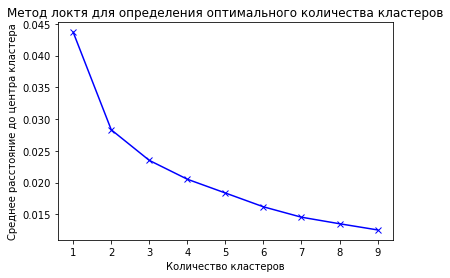

In [32]:
import matplotlib.pyplot as plt
plt.plot(K, distortions, 'bx-')
plt.xlabel('Количество кластеров')
plt.ylabel('Среднее расстояние до центра кластера')
plt.title('Метод локтя для определения оптимального количества кластеров')
plt.show()

In [33]:
kmeans = KMeans(n_clusters=4, random_state=0)
draw_clustered_map(data, kmeans.fit_predict(coord))

In [34]:
from sklearn.cluster import DBSCAN
clustering = DBSCAN(eps=3, min_samples=2).fit(X)
clustering.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3,

In [41]:
draw_clustered_map(data, DBSCAN(eps=0.005, min_samples=10).fit(coord).labels_)

In [42]:
graph_clustering = GraphClustering(n_clusters=10)
labels = graph_clustering.fit_predict(adjacency_matrix)
draw_clustered_map(data, labels)

**Ваш ответ здесь:**
1)Какие плюсы и минусы есть у каждого алгоритма?
k-means хорошо подходит для поиска кластеров с уже известной структурой данных(кол-во кластеров в них)
DBSCAN может найти кластеры любой формы и не требует количества кластеров в качестве гиперпараметра, также достаточно устойчив к выбросам, кластеризуя их в отдельный класс шумовых наблюдений. Но он не подходит для кластеров разной плотности

2)Чем отличаются разбиения на кластеры, получаемые разными алгоритмами?
Говоря о спектральной кластеризации, то тут следует сказать о вычислительной сложности метода, необходимости хранить матрицу смежности между объектами. В целом, этот подход является одним из наиболее мощных, являясь надстройкой над обычным k-means.

3)DBSCAN

-----

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [43]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
529,entertainment,020.txt,Public show for Reynolds portrait,Sir Joshua Reynolds' Portrait of Omai will ge...
959,politics,064.txt,Blair hails Turkey-EU talks deal,Tony Blair has hailed a deal bringing Turkey ...
707,entertainment,198.txt,Brookside actress Keaveney dies,"Actress Anna Keaveney, who appeared in Brooks..."
64,business,065.txt,EU aiming to fuel development aid,European Union finance ministers meet on Thur...
1183,politics,288.txt,New UKIP defection to 'Veritas',The UK Independence Party has lost one of its...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть🙈, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [57]:
import nltk
nltk.download('omw-1.4')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\fastaki\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\omw-1.4.zip.


In [58]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\fastaki\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\fastaki\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\fastaki\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [59]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [60]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [61]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

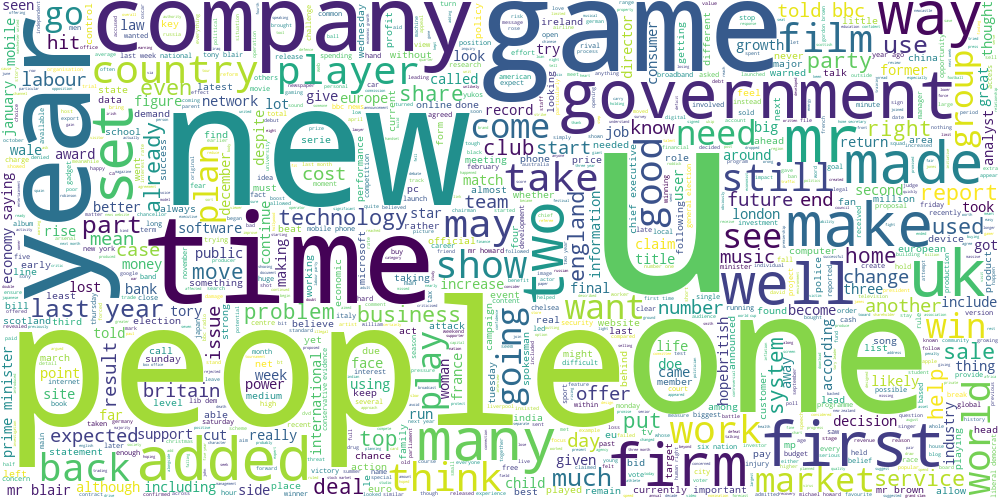

In [62]:
draw_wordcloud(data.text)

-----

**Задание 2.1 (1 балл).** 

* **(0.5 балла)** Обучите алгоритм K-Means на tf-idf представлениях текстов. 
* **(0.25 балла)** Постройте облака тегов для текстов из разных кластеров.
* **(0.25 балла)** (?) Получились ли темы интерпретируемыми? (?) Попробуйте озаглавить каждую тему.

**Подсказки:**
* Можно использовать готовую реализацию tf-idf векторайзера из sklearn
* При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова.
* Воздержитесь от использования N-грамм при обучении tf-idf.
* Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8).

**Ключевые слова:**
* *TfidfVectorizer*

In [63]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(data['text'])

In [65]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(X)
kmeans.labels_

array([3, 3, 3, ..., 1, 1, 7])

In [66]:
data['labels'] = kmeans.labels_
pd.unique(data['labels'])


array([3, 1, 6, 7, 0, 2, 4, 5])

In [68]:
for i in range(8):
    draw_wordcloud(data[data['labels']==i].text)
#почему-то не работает

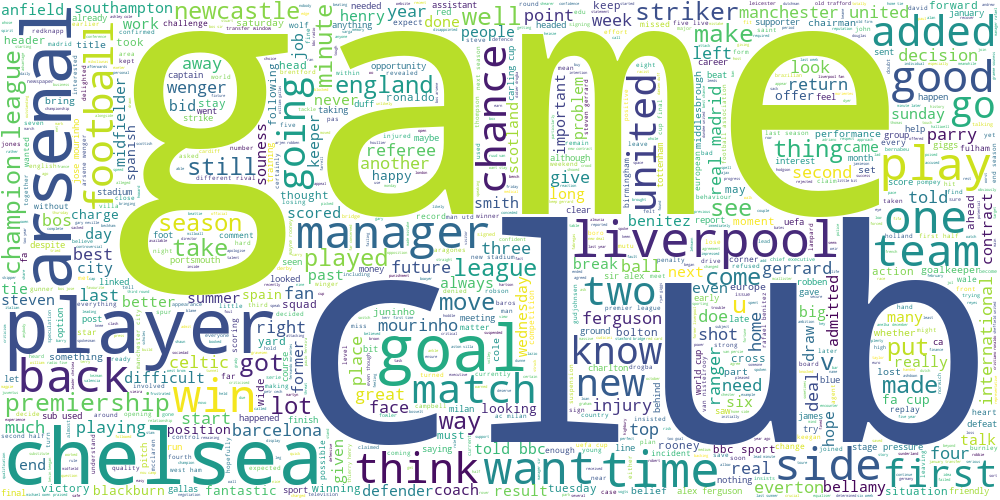

In [70]:
draw_wordcloud(data[data['labels']==0].text)
#АПЛ(английская премьер лига)

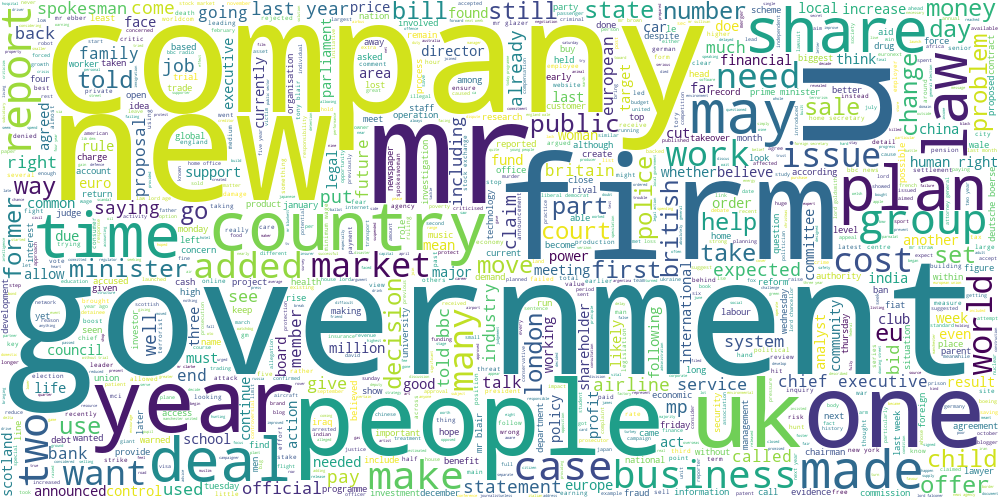

In [72]:
draw_wordcloud(data[data['labels']==1].text)
#экономика

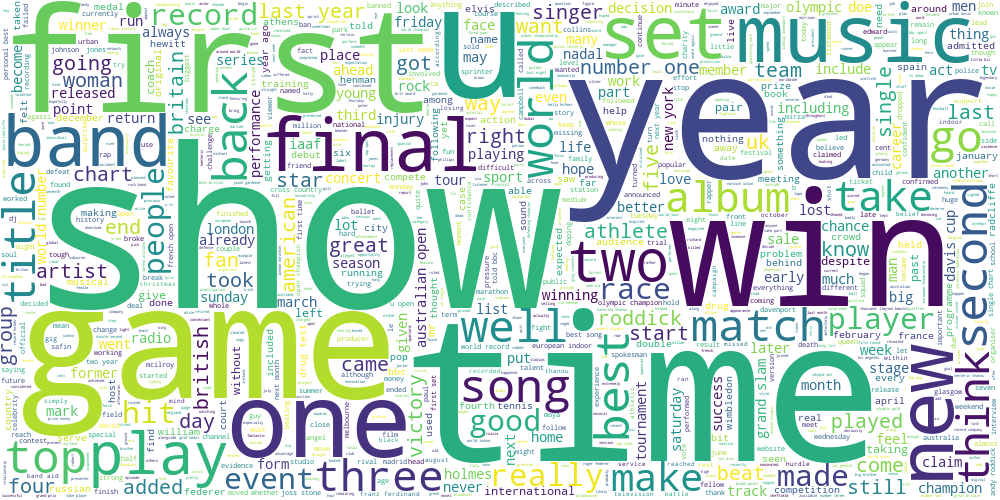

In [73]:
draw_wordcloud(data[data['labels']==2].text)
#музыка

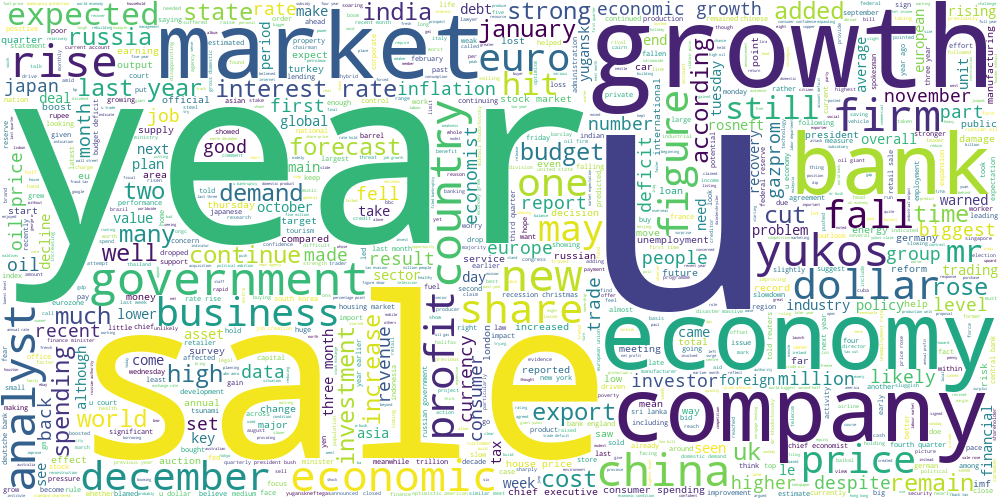

In [74]:
draw_wordcloud(data[data['labels']==3].text)
#экономика

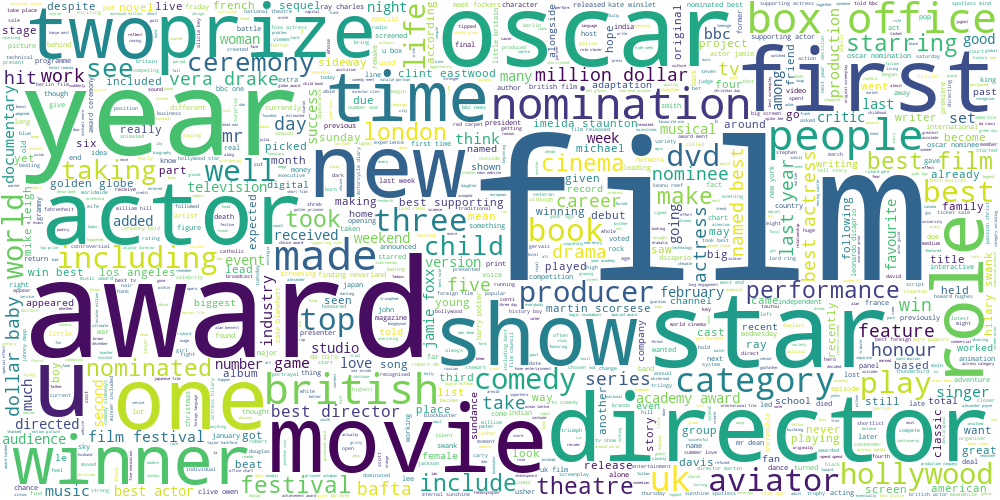

In [75]:
draw_wordcloud(data[data['labels']==4].text)
#кино тв и все такое

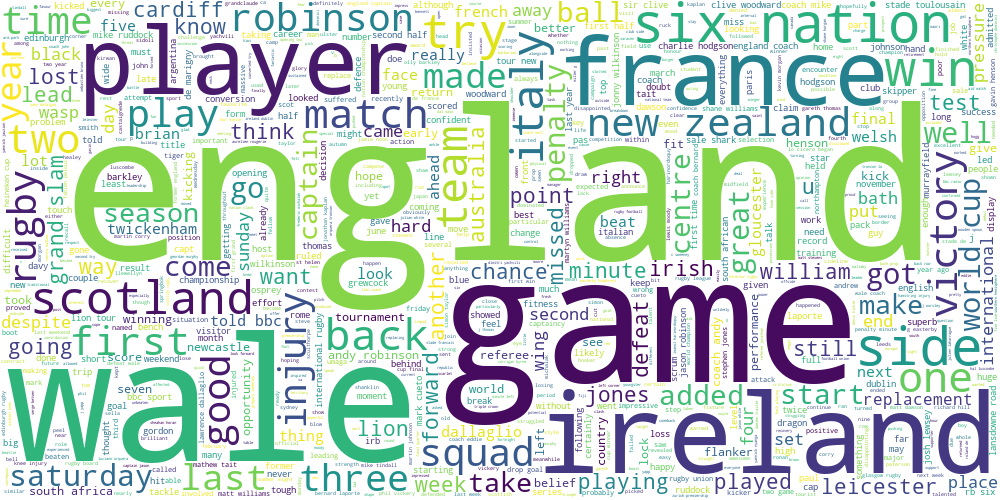

In [76]:
draw_wordcloud(data[data['labels']==5].text)
#страны и их история?

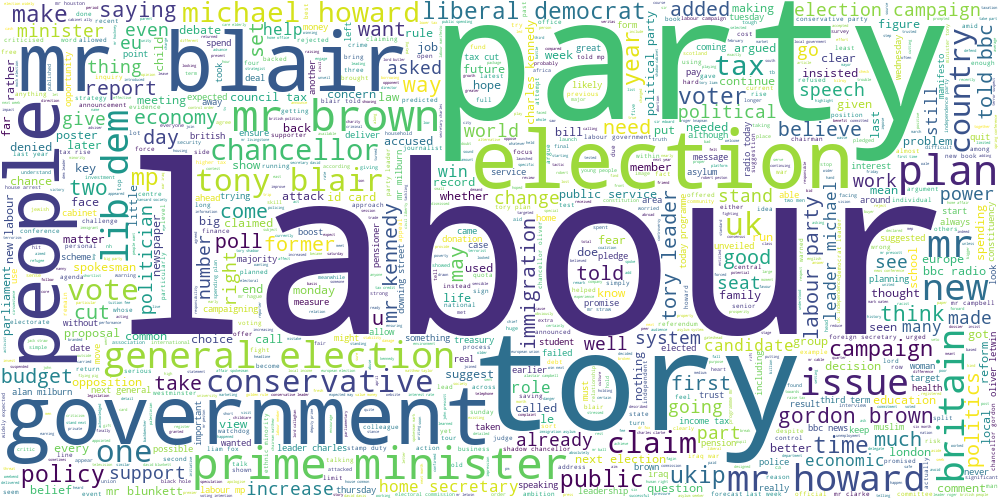

In [77]:
draw_wordcloud(data[data['labels']==6].text)
#политика

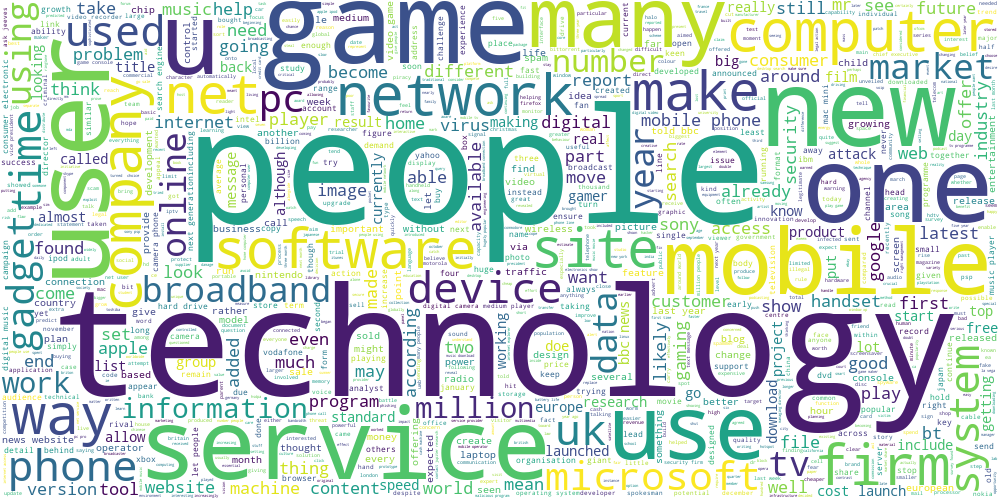

In [78]:
draw_wordcloud(data[data['labels']==7].text)
#новые технологии

**Ваш ответ здесь:**

-----

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера (`kmeans.cluster_centers_`). 

* **(0.3 балла)** Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков tf-idf максимальны.
* **(0.2 балла)** (?) Согласуются ли полученные слова с облаками тегов из прошлого задания?

In [79]:
center_word_idx = [0]*kmeans.cluster_centers_.shape[0]
for i in range(kmeans.cluster_centers_.shape[0]):
  center_word_idx[i] = np.argmax(kmeans.cluster_centers_[i], axis=0)

In [80]:
for i in range(kmeans.cluster_centers_.shape[0]):
  print(vectorizer.get_feature_names()[center_word_idx[i]])

chelsea
mr
band
growth
film
england
mr
mobile


c:\users\fastaki\pycharmprojects\pythonproject\venv\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


**Ваш ответ здесь:**
Некая корреляция есть. Большие слова в кластере коррелируют с названиями классов

-----

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). 

* п.1 Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации. 
 * **(0.3 балла)** При этом для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров;
 * **(0.5 балла)** Подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.
* п.2 **(0.5 балла)** Обучите двухмерные t-SNE ([Почитать можно тут, часть 2](https://github.com/esokolov/ml-course-hse/blob/master/2020-fall/lecture-notes/lecture11-unsupervised.pdf), а также посмотреть непосредственно в [sklearn](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html)) представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом.
* п.3 **(0.2 балла)** (?) Прокомментируйте получившиеся результаты. (?) Какой баланс кластеров получился у разных методов? (?) Соотносятся ли визуализации для текстов с визуализациями для географических данных?


**Замечания:**
* В этом задании используйте реализации спектральной кластеризации и t-SNE из `sklearn`
* В п.2 Лучше всего расположить визуализации на одном графике на трех разных сабплотах. 

**Подсказка:**
* Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [81]:
kmeans = KMeans(n_clusters=4, random_state=0).fit(X)

In [82]:
from sklearn.cluster import SpectralClustering
spectral_clustering = SpectralClustering(n_clusters=4, assign_labels="discretize", random_state=0).fit(X)

In [83]:
DBSCAN_clustering = DBSCAN(eps=1.285).fit(X)
np.unique(DBSCAN_clustering.labels_)
#4 кластера для данных один для шума

array([-1,  0,  1,  2,  3], dtype=int64)

In [85]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2).fit_transform(X)
names = np.array(['K-Means', 'Spectral', 'DBSCAN'])
for g in np.unique(kmeans.labels_):
    ix = np.where(kmeans.labels_ == g)

c:\users\fastaki\pycharmprojects\pythonproject\venv\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
c:\users\fastaki\pycharmprojects\pythonproject\venv\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [86]:
np.array([kmeans.labels_, DBSCAN_clustering.labels_, spectral_clustering.labels_]).T.shape

(2225, 3)

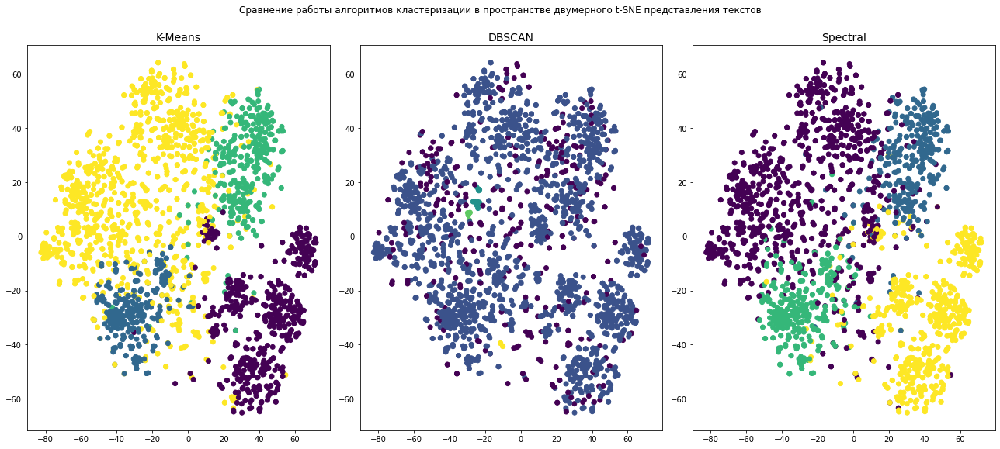

In [87]:
import matplotlib.pyplot as plt

X_embedded_vis = np.append(X_embedded, np.array([kmeans.labels_, DBSCAN_clustering.labels_, spectral_clustering.labels_]).T, axis=1)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 8))
fig.suptitle('Сравнение работы алгоритмов кластеризации в пространстве двумерного t-SNE представления текстов', y=1)
ax1.scatter(X_embedded[:,0], X_embedded[:,1], c = X_embedded_vis[:,2])
ax1.set_title(names[0], size=14)
ax2.scatter(X_embedded[:,0], X_embedded[:,1], c = X_embedded_vis[:,3])
ax2.set_title(names[2], size=14)
ax3.scatter(X_embedded[:,0], X_embedded[:,1], c = X_embedded_vis[:,4])
ax3.set_title(names[1], size=14)

fig.tight_layout()

**Ваш ответ здесь:**
DBSCAN наложил два кластера один на другой, ужав до минимума три оставшихся, даже не понять, какой из них шумовой

k-means достаточно неплохо кластеризует признаки в пространстве t-SNE представления

Тогда как спектральная кластеризация ведёт себя примерно аналогично k-means, хотя следует отметить, что этот алгоритм относит аномальные точки в пространстве двух главных компонент t-SNE представления к разным кластерам, что, наверное не особо хорошо, если вспомнить о принципе Rag-bag (все мусорные точки должны быть в одном кластере и не портить остальные).

-----

**Задание 2.4 (1.5 балла).** 

* **(0.5 балла)**  Обучите модель латентного размещения Дирихле (LDA).
* **(0.5 балла)**  Придумайте как превратить распределение тем для текста в номер его кластера. Опишите текстом (?) и приведите код и результаты его работы
* **(0.5 балла)** Возьмите параметр `n_components` у LDA в 2-3 раза больше, чем число кластеров для K-Means, и вновь посмотрите на темы. (?) Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Замечания:**
* Реализацию LDA во всех заданиях используйте из `sklearn` (LatentDirichletAllocation)

**Подсказка:**
* Не забудьте, что LDA работает с мешком слов, а не с tf-idf признаками.

**Ключевые слова:**
* *CountVectorizer,  LatentDirichletAllocation*

In [90]:
from sklearn.decomposition import LatentDirichletAllocation
lda = LatentDirichletAllocation(n_components=8*3, random_state=0)

In [91]:
from sklearn.feature_extraction.text import CountVectorizer
bow = CountVectorizer()
X_bow = bow.fit_transform(data['text'])

In [92]:
X_lda = lda.fit_transform(X_bow)
data['lda_labels'] = np.argmax(X_lda, axis=1)

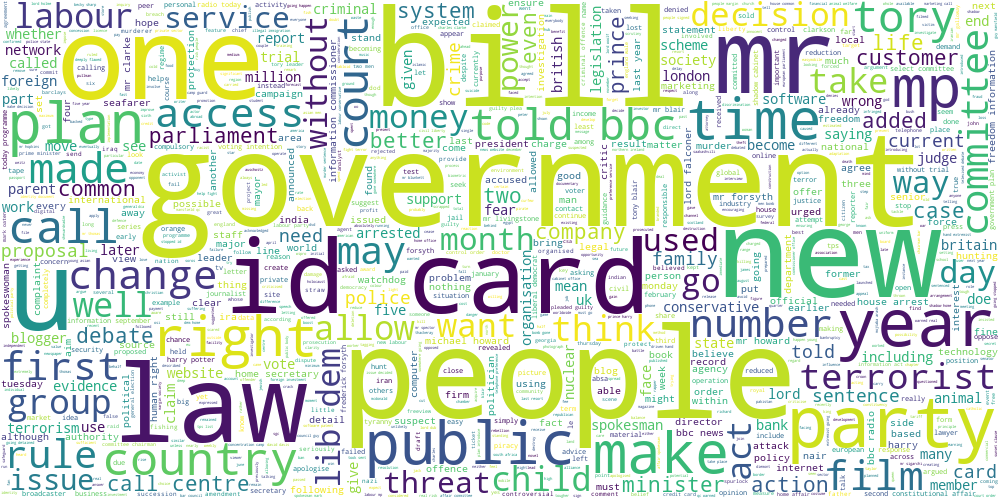

In [93]:
draw_wordcloud(data[data['lda_labels']==1].text)
#макроэкономика

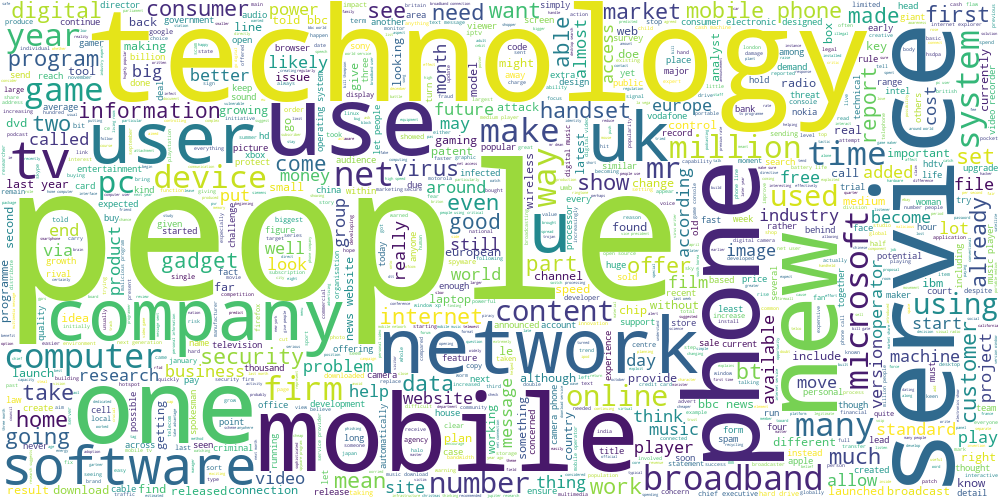

In [94]:
draw_wordcloud(data[data['lda_labels']==2].text)
#современные технологии

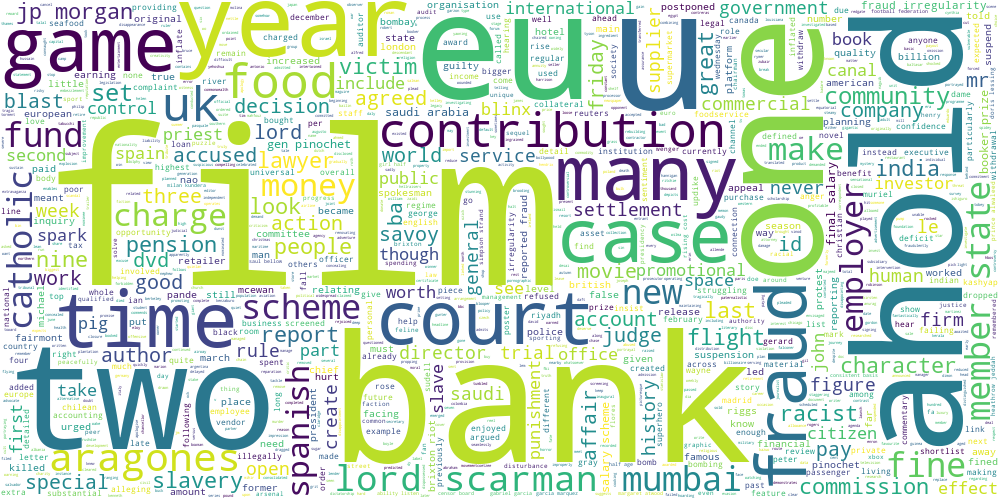

In [96]:
draw_wordcloud(data[data['lda_labels']==4].text)
#фильмы

**Ваш ответ здесь:**
Алгоритм хорошо подходит для выделения подтем

-----

## Часть 3. Transfer learning для задачи классификации текстов

**Замечание для всей части 3:**
* Для возможности получения **полного балла** accuracy всех алгоритмов на тесте должны быть не ниже 0.75, а также хотя бы один из рассмотренных в этой части алгоритмов должен достигнуть точности не менее 0.95 на тесте.

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей 🌚🌝. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

* **(0.4 балла)** Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.
* **(0.1 балла)** (?) У какой модели получилось лучшее качество? (?) С чем это связано?

**Подсказка:**
* Во второй модели расстояния до центров кластеров можно получиться при помощи метода KMeans.transform

**Ключевые слова:**
* *OrdinalEncoder, TfidfVectorizer, CountVectorizer, train_test_split, KMeans.transform*

In [97]:
y = data['category']

In [98]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0)

In [99]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
clf = LogisticRegression(random_state=0).fit(X_train, y_train)
y_pred = clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.9696629213483146

In [100]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(X)
kmeans.labels_

array([3, 3, 3, ..., 1, 1, 7])

In [101]:
X_dist = kmeans.transform(X)**2
df = pd.DataFrame(X_dist.sum(axis=1).round(2), columns=['sqdist'])
df['label'] = kmeans.labels_
df.head()

,sqdist,label
0,8.26,3
1,8.10,3
2,8.32,3
3,8.29,3
4,8.43,1


In [102]:
X_dist = np.reshape(np.array(df['sqdist']), (-1, 1))
X_train, X_test, y_train, y_test = train_test_split(X_dist, y, test_size=0.4, random_state=0)
clf = LogisticRegression(random_state=0).fit(X_train, y_train)
y_pred = clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.28651685393258425

In [103]:
X_train, X_test, y_train, y_test = train_test_split(X_lda, y, test_size=0.4, random_state=0)
clf = LogisticRegression(random_state=0).fit(X_train, y_train)
y_pred = clf.predict(X_test)
accuracy_score(y_pred, y_test)


0.9011235955056179

**Ваш ответ здесь:**
 Логистическая регрессия на tf-idf признаках выдала наилучший результат, поскольку мы уже выяснили через визуализацию результатов k-means, что он достаточно хорошо разделяет тексты между собой (пускай и в пространстве двух главных компонент t-SNE). В свою очередь, другие модели использовали несколько другие предпосылки, которые не оправданы в данном задании.

-----

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры (tf-idf, bag_of_words) и алгоритмы кластеризации (KMeans)) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%).

* **(1.2 балла)** Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 
* **(0.3 балла)** (?) Как изменились результаты по сравнению с обучением на полной разметке? (?) Сделайте выводы.

**Пояснение:**
* Тестовую выборку возьмите из задания 3.1. А разделять надо тренировочную из 3.1
* Обучаете векторайзер на 70%, применяете векторайзер к 5%, и на этих 5% уже обучаете классификатор.
* Итак, берем 3 варианта обучения из задания 3.1. Вы должны:
 * 1-я модель. Подобрать оптимальный гиперпараметр С у LogisticRegression на tf-idf признаках. Выбираем оптимальный параметр по валидационной выборке. Далее оцениваем обученную модель с оптимальном параметром на тесте.
 * 2-я модель. Шаг 1. Подобрать оптимальный гиперпараметр n_clusters у KMeans на tf-idf признаках: перебираем значения n_clusters и при каждом значении обучаем LogisticRegression на дефолтных параметрах (быть может с ограничением max_iter, об этом ниже). То есть классификатор в данном случае будет на одинаковых параметрах для всех представителей семейства алгоритмов KMeans. Далее выбираете оптимальный n_clusters по качеству классификатора на валидационной выборке. Шаг 2. Обучаете KMeans с оптимальным n_clusters и перебираете значение C у LogisticRegression. Также выбираете оптмальное по валидации. И только после двух подобранных оптимальных параметров выводите качество на тесте.
 * 3-я модель. Аналогично второй, только вместо KMeans --- LatentDirichletAllocation, а вместо tf-idf -- bag of words.

**Замечания:**
* Параметр $С$ у LogisticRegression перебирайте *по логарифмической сетке.* Обратите внимание, что $С$ НЕ перед регуляризатором, поэтому, скорее всего, наиболее оптимальными будут большие значения $C$. **Для возможности получения полного балла** переберите хотя бы 20 параметров, и затроньте значения в 1e-2 и 1e6 (по большей части значения должны лежать в этом отрезке)
* **Для возможности получения полного балла** параметр n_clusters у KMeans при переборе должен затрагивать значения в 10 и 1000 кластеров (по большей части значения должны лежать в этом отрезке), а также должно быть перебрано не менее 20 значений кластеров *(по линейной сетке)*
* **Для возможности получения полного балла** параметр n_components у LDA при переборе должен затрагивать значения в 5 и 14 (по большей части значения должны лежать в этом отрезке), а также должно быть перебрано не меньше 10 различных значений *(по линейной сетке)*

**Подсказка:**
* Может быть для ограничения времени обучения лучше будет ограничить параметр max_iter в LogisticRegression, равным, например, 1000

In [104]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(data['text'])

In [105]:
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()
y_digits = enc.fit_transform(np.reshape(np.array(data['category']), (-1, 1)))

c:\users\fastaki\pycharmprojects\pythonproject\venv\lib\site-packages\sklearn\preprocessing\_label.py:115: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [106]:
X_train, X_test, y_train, y_test = train_test_split(X, y_digits, random_state=0)
X_subtrain, X_val, y_subtrain, y_val = train_test_split(X_train, y_train, test_size=0.3, random_state=0)
X_labeled, X_unlabeled, y_labeled, y_unlabeled = train_test_split(X_subtrain, y_subtrain, test_size=13/14, random_state=0)

In [107]:
clf = LogisticRegression(random_state=0).fit(X_labeled, y_labeled)
y_pred = clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.35727109515260325

In [108]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]
# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=clf, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_val, y_val)

In [109]:
grid_result.best_params_

{'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}

In [110]:
clf = LogisticRegression(solver='newton-cg', penalty='l2', C=100,random_state=0).fit(X_labeled, y_labeled)
y_pred = clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.8061041292639138

In [112]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(X_subtrain)
X_dist = kmeans.transform(X_subtrain)**2

df = pd.DataFrame(X_dist.sum(axis=1).round(2), columns=['sqdist'])
df['label'] = kmeans.labels_

X_dist = np.reshape(np.array(df['sqdist']), (-1, 1))
X_train, X_test, y_train, y_test = train_test_split(X_dist, y_subtrain, test_size=0.4, random_state=0)
clf = LogisticRegression(random_state=0).fit(X_train, y_train)
y_pred = clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.29764453961456105

**Ваш ответ здесь:**
при сокрытии огромного количества полезной информации, которую мы раньше использовали для обучения, качество должно было ухудшиться. Однако благодаря кросс-валидации гиперпараметров моделей у нас получилось сгладить это ухудшение, причём значительно (0.96 на логрегрессии на tf-idf представлениях текстов ухудшилось лишь до 0.81)

-----

## Бонус

**Задание 4 (1 балл)**. 

* **(Максимум 0.8 балла, 0.4 балла за каждый исследованный метод)** Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. 
* **(0.2 балла)** (?) Получилось ли добиться лучшего качества? (?) Сделайте выводы.

In [118]:
from sklearn.semi_supervised import LabelSpreading
label_prop_model = LabelSpreading()

In [127]:
X_labeled, X_unlabeled, y_labeled, y_unlabeled = train_test_split(X_train, y_train, test_size=0.65, random_state=0)
y_unlabeled = [-1 for i in y_unlabeled]

In [128]:
from scipy.sparse import vstack
X_semi_train = vstack([X_labeled, X_unlabeled]).toarray()
y_semi_train = np.concatenate((y_labeled, np.array(y_unlabeled)), axis=0)

In [129]:
label_prop_model.fit(X_semi_train, list(y_semi_train))

LabelSpreading()

In [130]:
y_pred = label_prop_model.predict(X_test)
accuracy_score(y_pred, y_test)
#почему-то не очень хорошо получилось

0.26552462526766596

In [131]:
from sklearn.semi_supervised import SelfTrainingClassifier
self_training_model = SelfTrainingClassifier(LogisticRegression(solver='newton-cg', penalty='l2', C=100,random_state=0))
self_training_model.fit(X_semi_train, list(y_semi_train))

SelfTrainingClassifier(base_estimator=LogisticRegression(C=100, random_state=0,
                                                         solver='newton-cg'))

In [132]:
y_pred = self_training_model.predict(X_test)
accuracy_score(y_pred, y_test)

#чуть получше, но тоже плохо

0.30620985010706636

**Задание 5 (1 балл)**. Существует метрика BCubed ([Ссылка 1](https://github.com/esokolov/ml-course-hse/blob/master/2020-spring/lecture-notes/lecture17-clusterization.pdf), [Ссылка 2](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf)), которая хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). 

* **(0.2 балла)** Реализуйте подсчет метрики BCubed
* **(0.8 балла)** (?) Сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

**Замечание:**
* Пользоваться готовыми библиотечными методами для вычисления BCubed нельзя

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Ваш ответ здесь:**

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии🧙.

* Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). (?) Напишите, откуда брали данные и что это за данные
* **(1.7 балла)** Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое.
* **(0.3 балла)** (?) Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! 

**Подсказка:**
* Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (0.1 балла)**. Опишите свои ощущения от этой домашки🥔

In [ ]:
# Домашка интересная, спасибо